Introduction
============

This is interactive notebook regarding "Introduction to path planning". (Author: Björn Hein)

License is based on Creative Commons: Attribution-NonCommercial 4.0 International (CC BY-NC 4.0) (pls. check: http://creativecommons.org/licenses/by-nc/4.0/)

This notebook imports all discussed algorithms and does a comparison

**Attention**: This worksheet has external dependencies 

* to the files "InnoKonz2dEnv.py" or "InnoKonzShapelyEnv.py". These files contain simple 2D environments based on numpy arrays or the shapely library with an interface for the use as collision checking in the algorithms.
* to all modules like "**Algorithm**.py", which contains the corresponding algorithms 

Important links are:

* General Info: http://www.python.org
* Python tutorial http://www.python.org/doc/tut/
* NetworkX http://networkx.github.io/
* NumPy and SciPy Guide http://docs.scipy.org/
* Matplotlib gallery http://matplotlib.sourceforge.net/gallery.html


Remember that:

* you have to press ctrl-return or shift-return, to execute the code in the code sections, only then the variables are "generated" and can be used
* you can execute the whole notebook by Cell->runAll

Adding all planners
===========


In [2]:
import sys
sys.path.append("templates")
%load_ext autoreload
%autoreload 2

In [3]:
from IPPerfMonitor import IPPerfMonitor
import IPBasicPRM
import IPVISBasicPRM
import IPVisibilityPRM
import IPVISVisibilityPRM

import IPKClosestPRM # for visualization IKVISBasicPRM is used

import IPLazyPRM
import IPVISLazyPRM

import IPRRT
import IPRRTSimple
#import IPVISRRT

import IPAStar
import IPVISAStar

Set-up of the test scenario and the configuration for all planner
===================================

Following a procedure to compare all discussed planners are shown:

1. Configuration for every planner is defined
2. The configuration and the planner is stored in the variable setup, a Python dict()
3. the variable setup is then used to uniformly call the planning calls


In [4]:
plannerFactory = dict()

basicConfig = dict()
basicConfig["radius"] = 5
basicConfig["numNodes"] = 300
plannerFactory["basePRM"] = [IPBasicPRM.BasicPRM, basicConfig, IPVISBasicPRM.basicPRMVisualize]

# basicConfig2 = dict()
# basicConfig2["radius"] = 3
# basicConfig2["numNodes"] = 300
# plannerFactory["basePRM2"] = [IPBasicPRM.BasicPRM, basicConfig2, IPVISBasicPRM.basicPRMVisualize]

visbilityConfig = dict()
visbilityConfig["ntry"] = 300
plannerFactory["visibilityPRM"] = [IPVisibilityPRM.VisPRM, visbilityConfig, IPVISVisibilityPRM.visibilityPRMVisualize]

kClosestConfig = dict()
kClosestConfig["k"] = 3
kClosestConfig["numNodes"] = 300
plannerFactory["kClosestPRM"] = [IPKClosestPRM.KClosestPRM, kClosestConfig, IPVISBasicPRM.basicPRMVisualize]

lazyConfig = dict()
lazyConfig["initialRoadmapSize"] = 5 
lazyConfig["updateRoadmapSize"]  = 5 
lazyConfig["kNearest"] = 5 
plannerFactory["lazyPRM"] = [IPLazyPRM.LazyPRM, lazyConfig, IPVISLazyPRM.lazyPRMVisualize]

# astarConfig = dict()
# astarConfig["heuristic"] = 'euclidean' 
# astarConfig["w"]  = 0.5
# plannerFactory["astar"] = [IPAStar.AStar, astarConfig, IPVISAStar.aStarVisualize]

rrtConfig = dict()
rrtConfig["numberOfGeneratedNodes"] = 300 
rrtConfig["testGoalAfterNumberOfNodes"]  = 10
plannerFactory["RRT"] = [IPRRT.RRT, rrtConfig, IPVISBasicPRM.basicPRMVisualize]

rrtSimpleConfig = dict()
rrtSimpleConfig["numberOfGeneratedNodes"] = 300 
rrtSimpleConfig["testGoalAfterNumberOfNodes"]  = 10
plannerFactory["simpleRRT"] = [IPRRTSimple.RRTSimple, rrtSimpleConfig, IPVISBasicPRM.basicPRMVisualize]

In [5]:
class ResultCollection (object):
    
    def __init__(self, plannerFactoryName, planner, benchmark, solution, perfDataFrame):
        self.plannerFactoryName = plannerFactoryName
        self.planner = planner
        self.benchmark = benchmark
        self.solution = solution
        self.perfDataFrame = perfDataFrame

In [6]:
import IPTestSuite
import importlib

In [7]:
importlib.reload(IPTestSuite)

<module 'IPTestSuite' from 'd:\\Andreas\\Desktop\\Code\\RoboterProgrammierungExam\\IPTestSuite.py'>

In [8]:
for benchmark in IPTestSuite.benchList:
    print(benchmark.name)

Trap
Bottleneck
Fat bottleneck
Spirals
Entrance
Entrances
KIT
Inside
SSL
Ring
Hemispheres
Hammerhead
Zigzag
Spiral
medium
medium2
L-square
Teeth
Gearshift
Squares_easy
Zigzag_medium
Zigzag_hard
Japan
Haystack
HairPerson


In [9]:
resultList = list()

for key,producer in list(plannerFactory.items()):
    print(key, producer)
    for benchmark in IPTestSuite.benchList[0:10]:
        print ("Planning: " + key + " - " + benchmark.name)
        #planner = IPBasicPRM.BasicPRM(benchmark.collisionChecker)
        planner = producer[0](benchmark.collisionChecker)
        IPPerfMonitor.clearData()
        #try:
            
        resultList.append(ResultCollection(key,
                                           planner, 
                                           benchmark, 
                                           planner.planPath(benchmark.startList,benchmark.goalList,producer[1]),
                                           IPPerfMonitor.dataFrame()
                                          ),
                        )
        #except Exception as e:
        #    throw e
        #    print ("PLANNING ERROR ! PLANNING ERROR ! PLANNING ERROR ")
        #    pass
            



basePRM [<class 'IPBasicPRM.BasicPRM'>, {'radius': 5, 'numNodes': 300}, <function basicPRMVisualize at 0x0000028D127AFDC0>]
Planning: basePRM - Trap
Planning: basePRM - Bottleneck
Planning: basePRM - Fat bottleneck
Planning: basePRM - Spirals
Planning: basePRM - Entrance
Planning: basePRM - Entrances
Planning: basePRM - KIT
Planning: basePRM - Inside
Planning: basePRM - SSL
Planning: basePRM - Ring
visibilityPRM [<class 'IPVisibilityPRM.VisPRM'>, {'ntry': 300}, <function visibilityPRMVisualize at 0x0000028D127525E0>]
Planning: visibilityPRM - Trap
Planning: visibilityPRM - Bottleneck
Planning: visibilityPRM - Fat bottleneck
Planning: visibilityPRM - Spirals
Planning: visibilityPRM - Entrance
Planning: visibilityPRM - Entrances
Planning: visibilityPRM - KIT
Planning: visibilityPRM - Inside
Planning: visibilityPRM - SSL
Planning: visibilityPRM - Ring
kClosestPRM [<class 'IPKClosestPRM.KClosestPRM'>, {'k': 3, 'numNodes': 300}, <function basicPRMVisualize at 0x0000028D127AFDC0>]
Planning: 

In [10]:
print(plannerFactory.items())

dict_items([('basePRM', [<class 'IPBasicPRM.BasicPRM'>, {'radius': 5, 'numNodes': 300}, <function basicPRMVisualize at 0x0000028D127AFDC0>]), ('visibilityPRM', [<class 'IPVisibilityPRM.VisPRM'>, {'ntry': 300}, <function visibilityPRMVisualize at 0x0000028D127525E0>]), ('kClosestPRM', [<class 'IPKClosestPRM.KClosestPRM'>, {'k': 3, 'numNodes': 300}, <function basicPRMVisualize at 0x0000028D127AFDC0>]), ('lazyPRM', [<class 'IPLazyPRM.LazyPRM'>, {'initialRoadmapSize': 5, 'updateRoadmapSize': 5, 'kNearest': 5}, <function lazyPRMVisualize at 0x0000028D12752E50>]), ('RRT', [<class 'IPRRT.RRT'>, {'numberOfGeneratedNodes': 300, 'testGoalAfterNumberOfNodes': 10}, <function basicPRMVisualize at 0x0000028D127AFDC0>]), ('simpleRRT', [<class 'IPRRTSimple.RRTSimple'>, {'numberOfGeneratedNodes': 300, 'testGoalAfterNumberOfNodes': 10}, <function basicPRMVisualize at 0x0000028D127AFDC0>])])


C:\Users\Andreas\AppData\Roaming\Python\Python39\site-packages\descartes\patch.py:62: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  vertices = concatenate([
C:\Users\Andreas\AppData\Roaming\Python\Python39\site-packages\descartes\patch.py:64: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  [asarray(r)[:, :2] for r in t.interiors])
C:\Users\Andreas\AppData\Local\Temp/ipykernel_17372/2568140470.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig_local = plt.figure(figsize=(10,10))


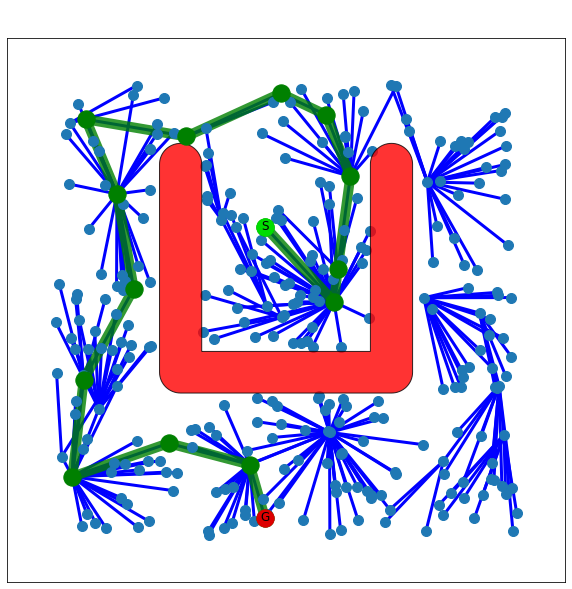

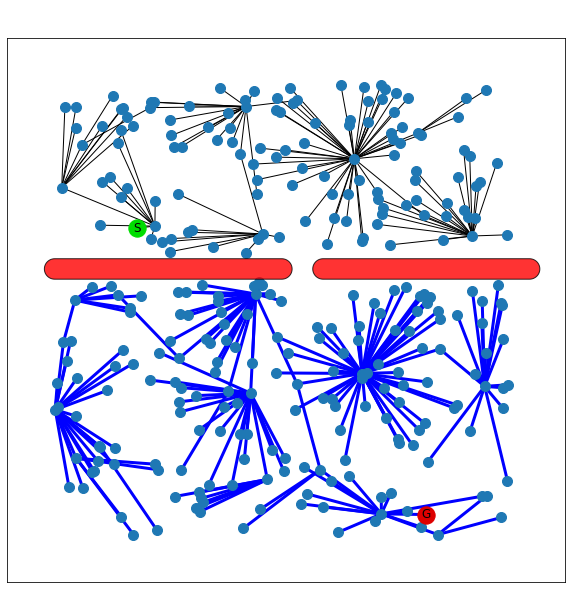

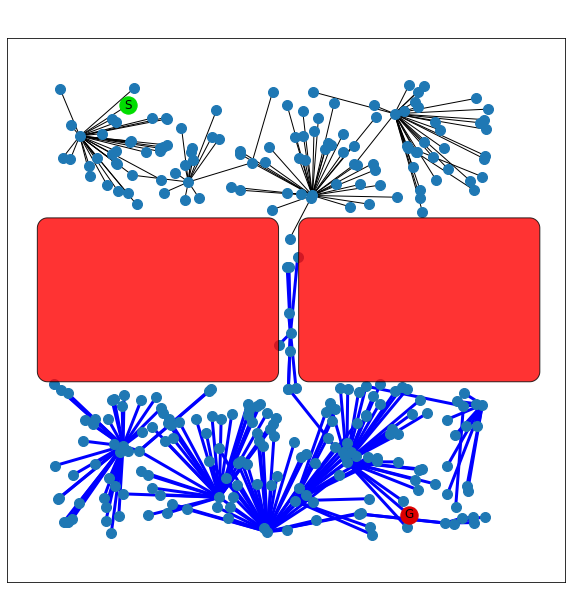

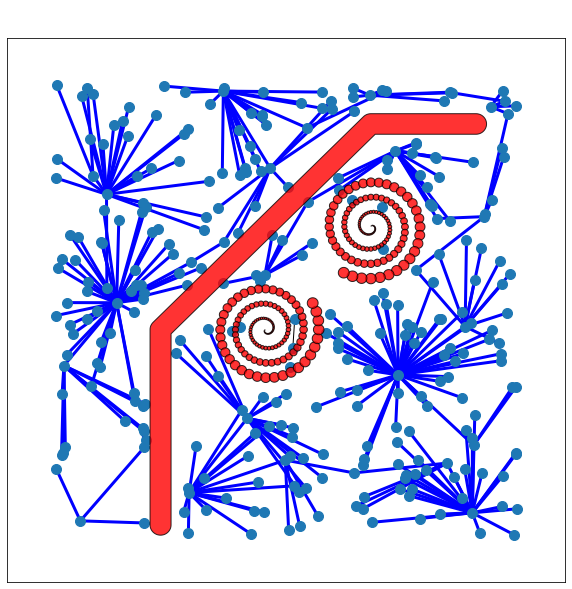

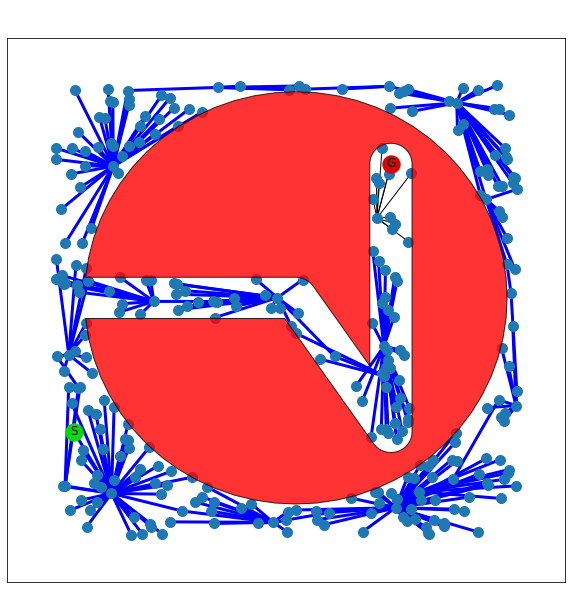

...

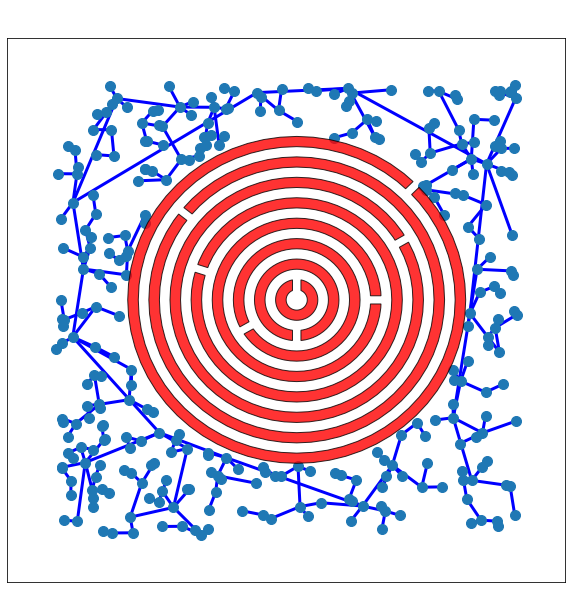

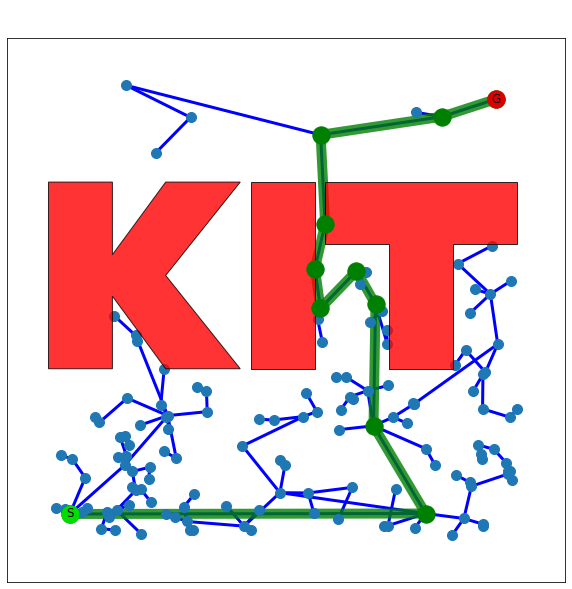

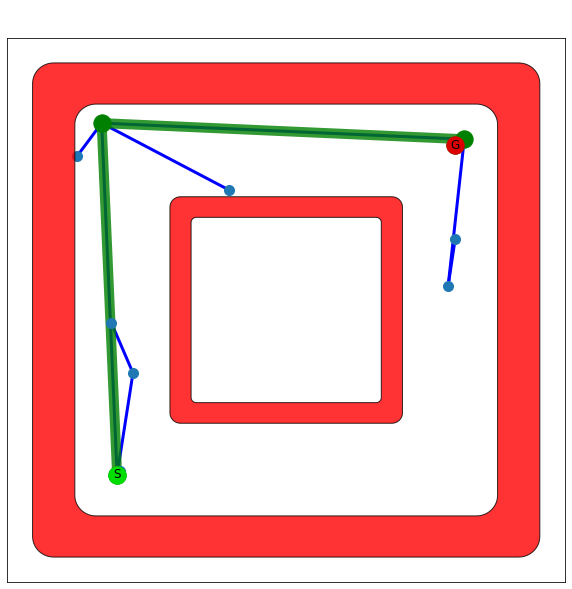

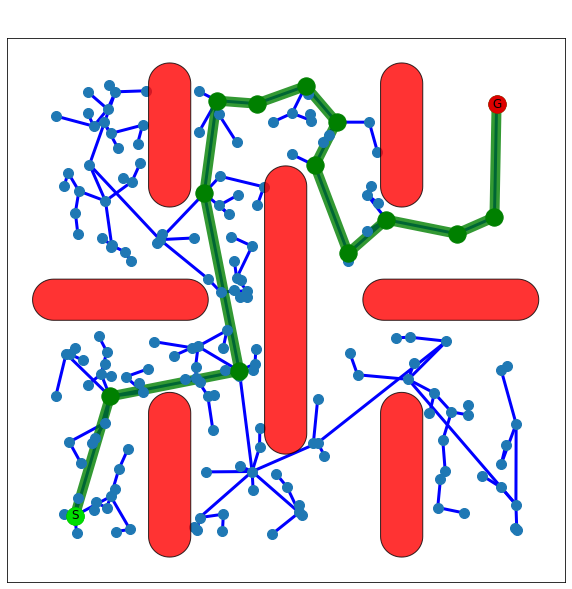

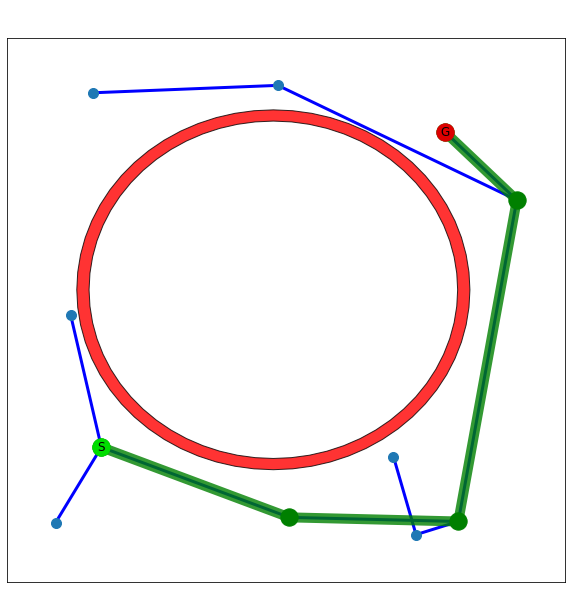

In [11]:
import matplotlib.pyplot as plt

for result in resultList:
    
    fig_local = plt.figure(figsize=(10,10))
    ax = fig_local.add_subplot(1,1,1)
    title = result.plannerFactoryName + " - " + result.benchmark.name
    if result.solution == []:
        title += " (No path found!)"
    title += "\n Assumed complexity level " + str(result.benchmark.level)
    ax.set_title(title, color='w')
    try:
        #IPVISBasicsPRM.basicPRMVisualize(result.planner, result.solution, ax=ax, nodeSize=100))
        plannerFactory[result.plannerFactoryName][2](result.planner, result.solution, ax=ax, nodeSize=100)
    except:
        pass
    

In [12]:
for result in resultList:
    print(result.benchmark.name  + " - " +  result.plannerFactoryName, result.solution)

Trap - basePRM ['start', 6, 8, 9, 66, 96, 41, 32, 1, 85, 36, 7, 44, 11, 'goal']
Bottleneck - basePRM []
Fat bottleneck - basePRM []
Spirals - basePRM []
Entrance - basePRM []
Entrances - basePRM []
KIT - basePRM []
Inside - basePRM ['start', 1, 13, 14, 48, 16, 2, 26, 5, 'goal']
SSL - basePRM ['start', 23, 89, 10, 9, 5, 11, 3, 29, 119, 43, 50, 27, 2, 30, 7, 20, 'goal']
Ring - basePRM ['start', 1, 6, 103, 16, 15, 25, 26, 14, 48, 4, 'goal']
Trap - visibilityPRM ['start', 0, 24, 7, 17, 1, 14, 'goal']
Bottleneck - visibilityPRM ['start', 0, 171, 'goal']
Fat bottleneck - visibilityPRM ['start', 1, 72, 30, 33, 0, 'goal']
Spirals - visibilityPRM []
Entrance - visibilityPRM ['start', 84, 0, 22, 2, 70, 13, 34, 12, 27, 3, 'goal']
Entrances - visibilityPRM []
KIT - visibilityPRM ['start', 30, 3, 34, 23, 51, 'goal']
Inside - visibilityPRM ['start', 8, 4, 10, 9, 29, 'goal']
SSL - visibilityPRM ['start', 8, 50, 2, 128, 106, 109, 3, 42, 31, 'goal']
Ring - visibilityPRM ['start', 34, 0, 7, 6, 10, 'goal

Trap - basePRM
Trap - visibilityPRM
Trap - kClosestPRM
Trap - lazyPRM
Trap - RRT
Trap - simpleRRT
Bottleneck - basePRM
Bottleneck - visibilityPRM
Bottleneck - kClosestPRM
Bottleneck - lazyPRM
Bottleneck - RRT
Bottleneck - simpleRRT
Fat bottleneck - basePRM
Fat bottleneck - visibilityPRM
Fat bottleneck - kClosestPRM
Fat bottleneck - lazyPRM
Fat bottleneck - RRT
Fat bottleneck - simpleRRT
Spirals - basePRM
Spirals - visibilityPRM
Spirals - kClosestPRM
Spirals - lazyPRM
Spirals - RRT
Spirals - simpleRRT
Entrance - basePRM
Entrance - visibilityPRM
Entrance - kClosestPRM
Entrance - lazyPRM
Entrance - RRT
Entrance - simpleRRT
Entrances - basePRM
Entrances - visibilityPRM
Entrances - kClosestPRM
Entrances - lazyPRM
Entrances - RRT
Entrances - simpleRRT
KIT - basePRM
KIT - visibilityPRM
KIT - kClosestPRM
KIT - lazyPRM
KIT - RRT
KIT - simpleRRT
Inside - basePRM
Inside - visibilityPRM
Inside - kClosestPRM
Inside - lazyPRM
Inside - RRT
Inside - simpleRRT
SSL - basePRM
SSL - visibilityPRM
SSL - kC

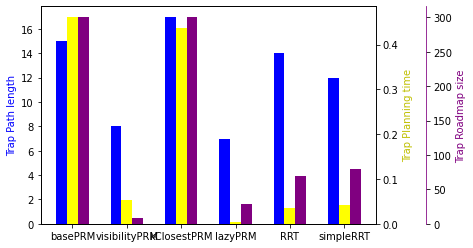

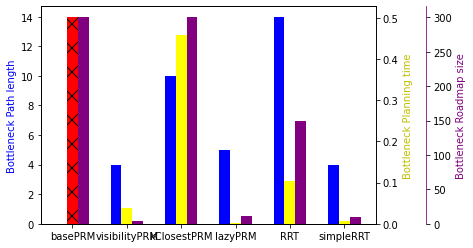

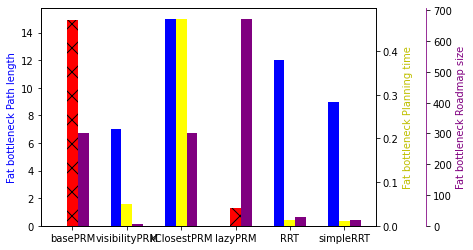

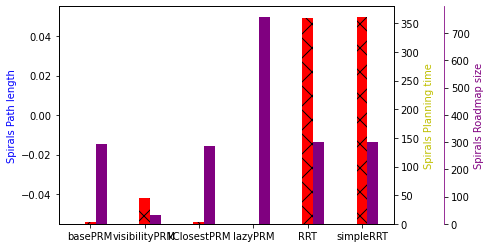

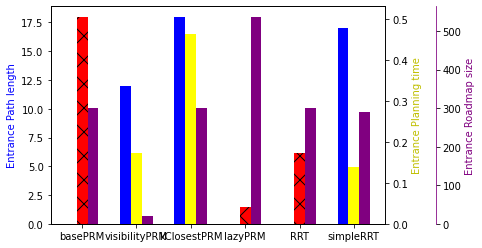

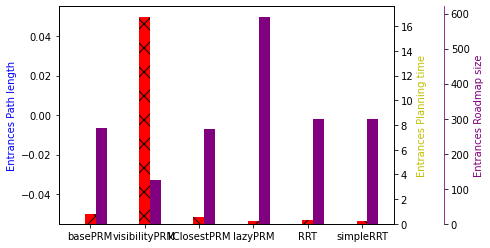

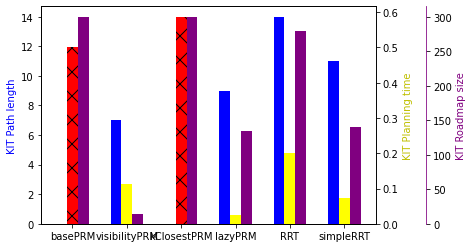

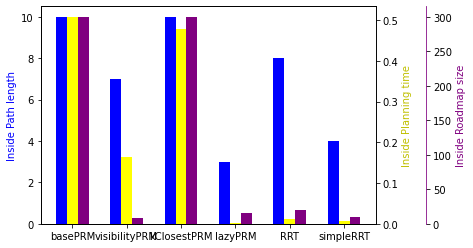

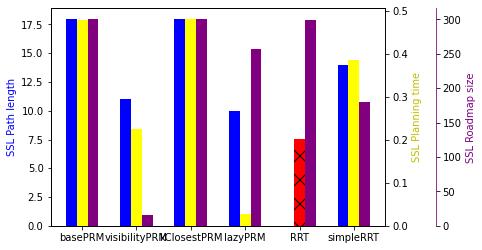

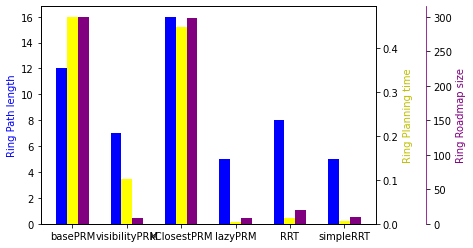

In [13]:
import numpy as np
for bench in IPTestSuite.benchList[0:10]:
    title = bench.name
    pathLength = dict()
    planningTime = dict()
    roadmapSize  = dict()
    
    for result in resultList:
        if result.benchmark.name == bench.name:
            print(result.benchmark.name  + " - " +  result.plannerFactoryName)
            pathLength[result.plannerFactoryName] = len(result.solution)
            planningTime[result.plannerFactoryName] = result.perfDataFrame.groupby(["name"]).sum()["time"]["planPath"]
            roadmapSize[result.plannerFactoryName] = result.planner.graph.size()
    
    fig, ax = plt.subplots()
    
    width = 0.2
    
    ax.bar(np.arange(len(pathLength.keys())), pathLength.values(),width, color="blue")
    ax.set_ylabel(title + " Path length", color="blue")
    ax.set_xticks(np.arange(len(pathLength.keys())) + width)
    ax.set_xticklabels(pathLength.keys())

    ax2 = ax.twinx()
    bar = ax2.bar(np.arange(len(pathLength.keys()))+width, planningTime.values(),width, color="red")
    ax2.set_ylabel(title + " Planning time", color="y")

    # Add coloring and patterns on axis two
    hatches = ['x' if length==0 else '' for length in pathLength.values()]
    color   = ['red' if length==0 else 'yellow' for length in pathLength.values()]
    for i,thisbar in enumerate(bar.patches):
        thisbar.set_facecolor(color[i])
        thisbar.set_hatch(hatches[i])

    # Multiple axes 
    ax3 = ax.twinx()
    ax3.bar(np.arange(len(pathLength.keys()))+2*width, roadmapSize.values(),width, color="purple")
    ax3.set_ylabel(title + " Roadmap size",  color="purple")
    ax3.spines['right'].set_position(('axes', 1.15))
    ax3.spines['right'].set_color("purple")
    

    
        
    

In [14]:
result.perfDataFrame.groupby(["name"]).sum()["time"]

name
_getRandomFreePosition    0.000000
lineInCollision           0.002002
planPath                  0.006002
pointInCollision          0.000000
Name: time, dtype: float64

C:\Python39\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
C:\Python39\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)
C:\Python39\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
C:\Python39\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial, where)
C:\Python39\lib\site-packages\numpy\core\_methods.py:44: RuntimeWarning: invalid value encountered in reduce
  return umr_minimum(a, axis, None, out, keepdims, initial, where)
C:\Python39\lib\site-packages\numpy\core\_methods.py:40: RuntimeWarning: invalid value encountered in reduce
  return um

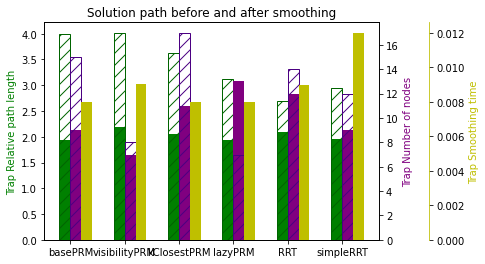

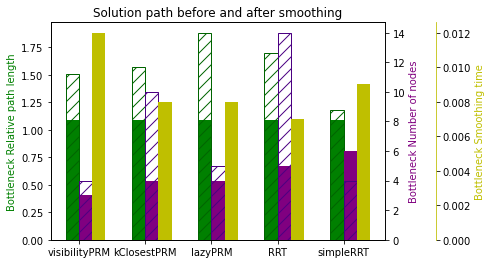

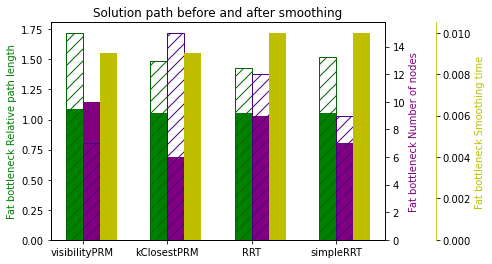

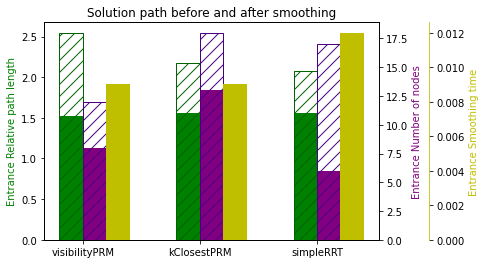

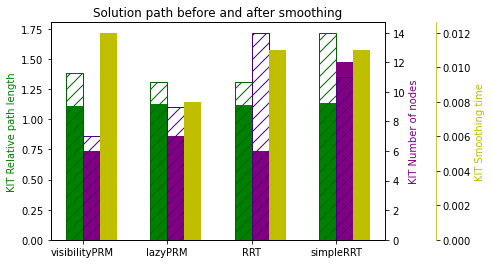

...

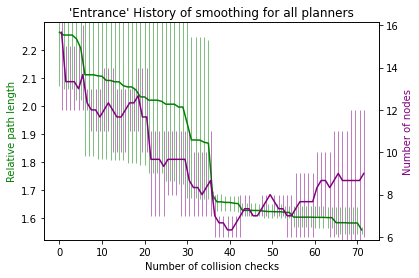

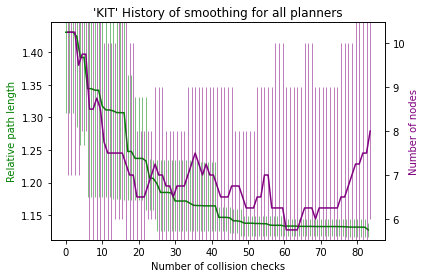

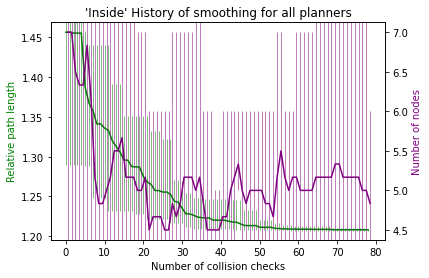

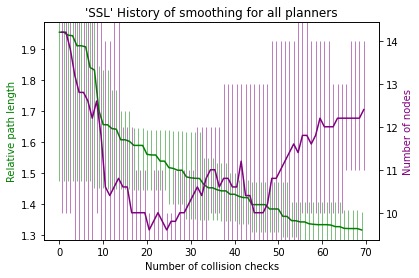

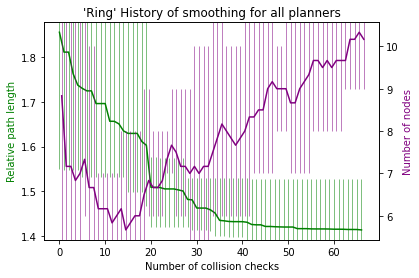

In [58]:
from IPSmoothing import IPSmoothing
k = 3 # Parameter for smoothing
eps = 0.1 # Cancel threshold for DelTree
debug_counter = 0
variance_steps = 10

IPSmoothing.statistics = []

for result in resultList:
    debug_counter += 1
    # print(f"Step: {debug_counter}")

    smoother = IPSmoothing(result, plannerFactory) #=======Added planner factory for iterative plotting functionality Remove

    smoothed_graph = smoother.smooth_solution(k, eps, variance_steps)

    # if smoothed_graph is not None:
    #     #smoother.visualize_path(plannerFactory, smoothed_graph, debug_counter) #==========Added Debug Counter
    #     smoother.draw_history()

    # break  #====================================Remove

IPSmoothing.draw_statistics(IPTestSuite.benchList[0:10])

IPSmoothing.draw_history_per_benchmark(IPTestSuite.benchList[0:10], num_coll_checks = 100, combine_all = False)



